In [1]:
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from librosa.display import specshow

%matplotlib inline


In [2]:
import numpy as np
import librosa
import os

class AudioLoader(object):
    def __init__(self):
        self.gram_shape = None
    def get_filelist(self, dirpath, recurse=False):
        return(librosa.util.find_files(dirpath, recurse=recurse))
    def create_spectrograms(self, files, ws=1024, hs=1024//2, nb=128,
                            lmatch="pad", norm=False, sgs=True, verbose=False):
        """
        Create spectrograms for a list of files and return a numpy array
        :param files: Path where audio is stored
        :param ws: window size for the short time fourier transform
        :param hs: hop size for the stft
        :param lmatch: length matching of the spectrograms pad or trim
        :param norm: normalize spectrograms # consider -1 to 1 normalization
        :param sgs: save the shape of the spectrograms or use saved shape
        :param verbose: testing stuff
        :return: numpy array of spectrograms in format (N, freq_bands, time)
        """
        grams = []
        srs = []
        shapes = []
        for file in files:
            sig, sr = librosa.core.load(file, sr=None)
            gram = librosa.feature.melspectrogram(sig, sr=sr, n_fft=ws,
                                                  n_mels=nb, hop_length=hs)
            gram = librosa.power_to_db(gram, ref=np.max)
            if not sgs:
                if gram.shape[1] > self.gram_shape[1]:
                    gram = trim_sample(gram, self.gram_shape, True)
                else:
                    gram = pad_sample(gram, self.gram_shape, True)

            gram -= gram.min()
            if norm:
                gram = librosa.util.normalize(gram)
                #gram -= gram.mean()
                #gram /= gram.std()
            grams.append(gram)
            srs.append(sr)
            shapes.append(gram.shape)
        if not sgs:
            return(np.array(grams), shapes)
        elif lmatch == "pad":
            ms = max(shapes) if sgs else self.gram_shape
            grams = np.array([pad_sample(g,ms) for g in grams])
        elif lmatch == "trim":
            ms = min(shapes) if sgs else self.gram_shape
            grams = np.array([trim_sample(g,ms) for g in grams])
        else:
            print("Method {} not recognized".format(lmatch))
            return(grams)
        if sgs:
            self.gram_shape = ms
        if verbose:
            print("shapes:", shapes)
            print("final grams shape:", grams.shape)
        return(grams, shapes)

class VADLabeler(object):
    """
    Basic VAD Labeler based on mean power in middle frequency bands
    """
    def __init__(self, threshold=30):
        self.threshold = threshold
        self.label_max_len = -1
    def label(self, grams):
        """
        :param grams: 3d input in the form (num samples, freq bands, time)
        :return: binary 2d numpy array in the form (num samples, time)
        """
        hpids = np.where(grams[:,10:100,:].mean(axis=1) > self.threshold)
        L = np.zeros((grams.shape[0], grams.shape[2]))
        L[hpids] = 1
        return(L)
    def tedlium_label(self, wav_manifest, ddims, csv_manifest=None, use_lml = False):
        if csv_manifest is None:
            csv_manifest = []
            for wav_path in wav_manifest:
                fn, ext = os.path.splitext(os.path.basename(wav_path))
                fn = "_".join(fn.split("_")[:-2]) + ".csv"
                csv_path = os.path.join(os.path.dirname(os.path.dirname(wav_path)),
                                        "csv", fn)
                csv_manifest += [csv_path]
        L = []
        for wav_path, csv_path, dd in zip(wav_manifest, csv_manifest, ddims):
            with open(csv_path, "r") as f:
                data = f.readline().strip().split(",")
            sr, ws, hs = int(data[1]), int(data[2]), int(data[3])
            labels = data[4:]
            wfp, wext = os.path.splitext(wav_path)
            st, end = wfp.split("_")[-2:]
            st_hop = int(st)//hs
            if end == "end":
                end_hop = None
            elif st_hop+dd < len(labels):
                end_hop = st_hop+dd
            else:
                end_hop = len(labels)
                st_hop = end_hop-dd
            L += [np.array(labels[st_hop:end_hop]).astype("int")]
            if len(labels[st_hop:end_hop]) > self.label_max_len:
                self.label_max_len = len(labels[st_hop:end_hop])
        L = self._pad_labels(L)
        return(np.array(L))
    def dummy_labels(self, grams):
        return(np.zeros((grams.shape[0], grams.shape[2])))
    def _pad_labels(self, labels):
        return([np.r_[l, np.zeros(self.label_max_len-l.shape[0])] if self.label_max_len>l.shape[0] else l for l in labels])

class NoiseInjector(object):
    def __init__(self, noise_multiplier=1.):
        self.nm = noise_multiplier
    def mix_grams(self, data, noise, rescale=False, nm=None):
        if nm is None:
            nm = self.nm
        # pad/trim as needed
        if data.shape != noise.shape:
            f = trim_sample if noise.shape > data.shape else pad_sample
            noise = f(noise, data.shape, True)
        # additive noise and rescaling
        g = data + (noise * self.nm)
        if rescale:
            g *= data.max() / g.max()
        return(g)
    def mix_sigs(self, sig, noise):
        """
        TODO
        """
        return(sig+(noise*self.nm))


def trim_sample(g, ms, rd=False):
    st = np.random.choice(g.shape[1]-ms[1]) if rd else 0
    return(g[:,st:(st+ms[1])])

def pad_sample(g, ms, rd=False):
    if ms[1] == g.shape[1]:
        return(g)
    st = np.random.choice(ms[1]-g.shape[1]) if rd else 0 # 1 to k-1
    g_new = np.c_[np.ones((g.shape[0],st))*g.min(),
                  g,
                  np.ones((g.shape[0],ms[1]-(st+g.shape[1])))*g.min()]
    return(g_new)


In [7]:
N = 10
trainset_path = "/home/david/Programming/python/snips/data/tedlium_r2_dataset/train"

# data loading
al = AudioLoader()
data_manifest = al.get_filelist(trainset_path, recurse=True)
data_manifest = np.random.choice(data_manifest, N).tolist()
data, data_dims = al.create_spectrograms(data_manifest, lmatch="pad")
noise_manifest = al.get_filelist("/home/david/Programming/python/snips/data/rirs_noises_dataset/pointsource_noises")
noise_manifest = np.random.choice(noise_manifest, len(data_manifest)).tolist()
noises, noises_dims = al.create_spectrograms(noise_manifest, sgs=False)
# sort audio by length in descending order
data_dims = np.array(data_dims)
idx = np.argsort(data_dims, axis=0)[:,1][::-1]
data = data[idx]
data_dims = data_dims[idx]
data_manifest = [data_manifest[i] for i in idx]

# label data
lb = VADLabeler()
labels = lb.tedlium_label(data_manifest, data_dims[:,1])


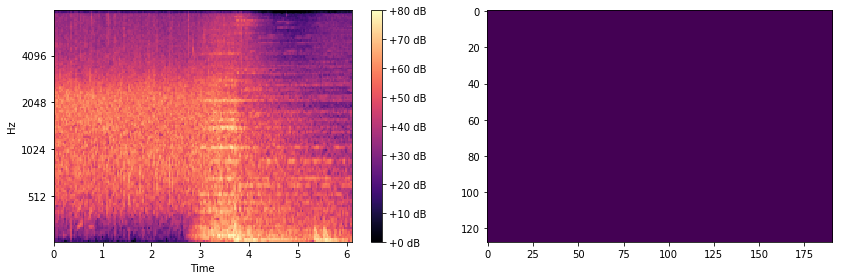

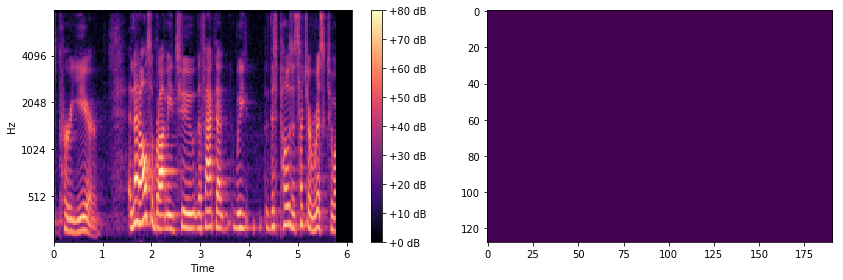

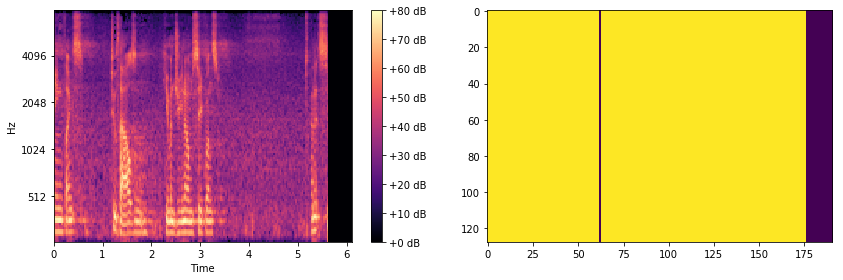

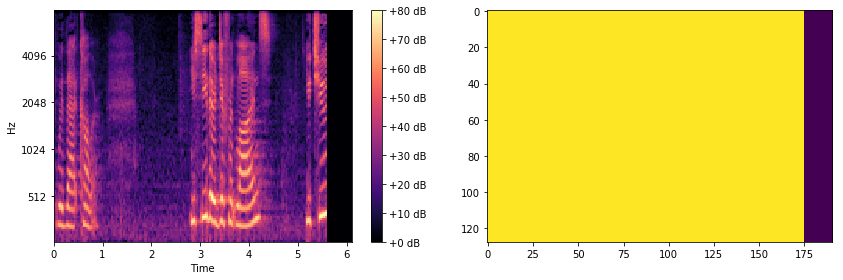

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


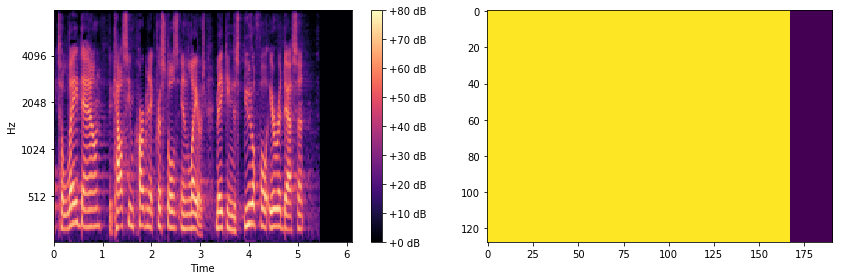

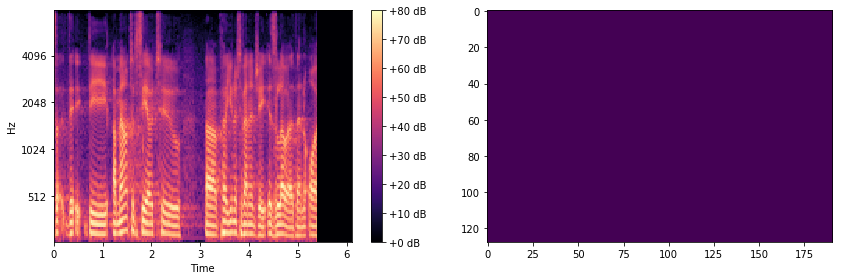

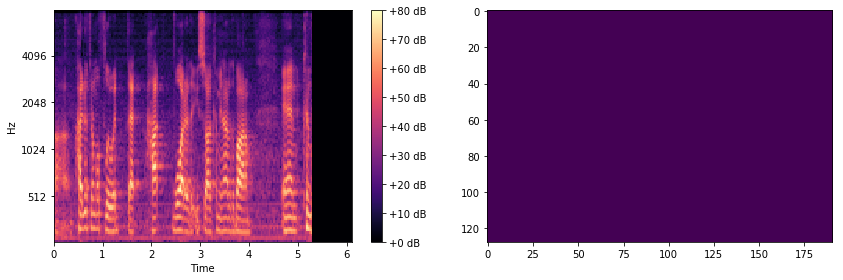

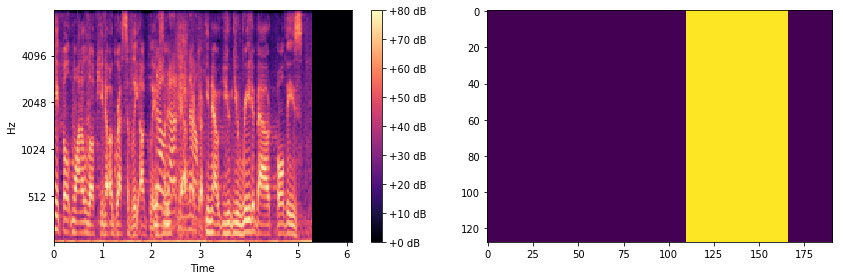

In [9]:
hs = 512
sr = 16000
fmax = sr/2
# plot
for file, gram, vad_labels in zip(data_manifest, data, labels):
    display(Audio(file))
    #fig, ax = plt.subplots(nrows=1, ncols=2)
    fig = plt.figure(figsize=(12,4))
    fig.add_subplot(1,2,1)
    specshow(gram, x_axis='time', sr=sr, hop_length=hs, y_axis='mel', fmax=fmax)
    plt.colorbar(format='%+02.0f dB')
    fig.add_subplot(1,2,2)
    vad_labels = np.tile(vad_labels, (gram.shape[0],1))
    plt.imshow(vad_labels)
    plt.tight_layout()
    plt.show()


In [222]:
sig_manifest = librosa.util.find_files("algore/wav")

for sig_path in sig_manifest[:6]:
    display(Audio(sig_path))


176

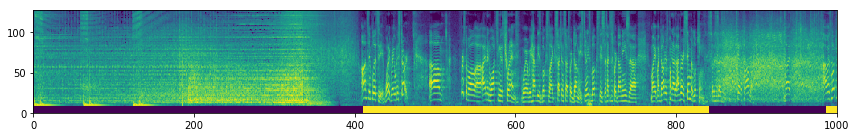

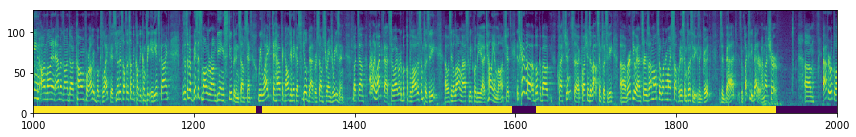

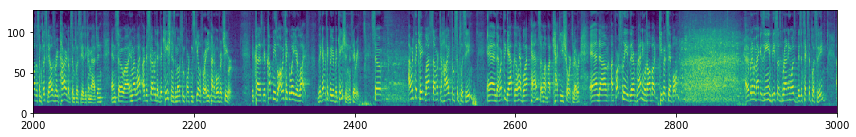

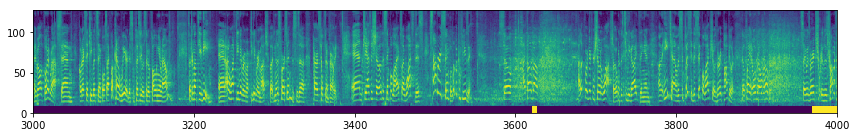

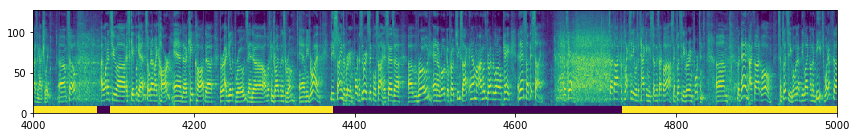

...

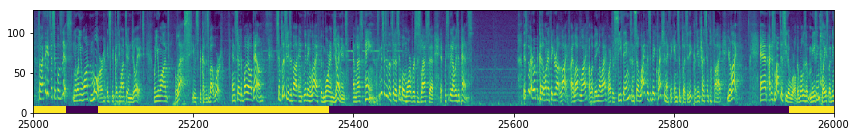

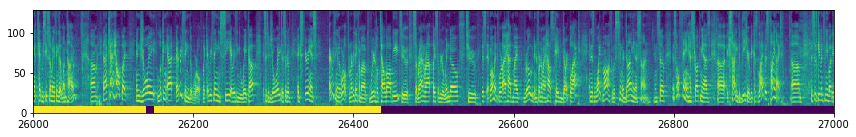

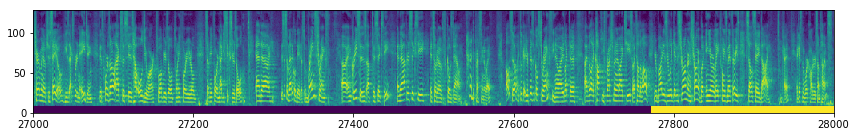

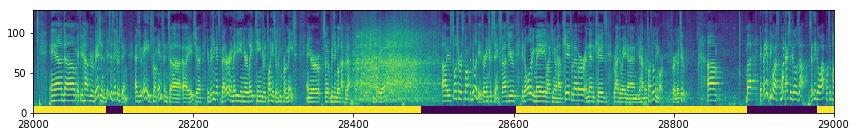

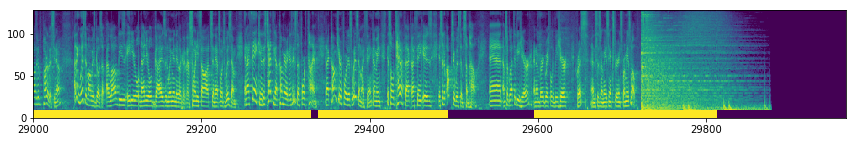

In [223]:
def stich(grams, dims):
    dims = np.array(dims)
    nl = np.sum(dims[:,1])-grams.shape[0]//2
    canvas = np.zeros((grams.shape[1], nl))
    st = 0
    for g, gd in zip(grams, dims):
        end = st+gd[1]-1
        canvas[:,st:end] = g[:,:(gd[1]-1)]
        st = end
    return(canvas)

display(len(sig_manifest))

al = AudioLoader()
grams, gram_dims = al.create_spectrograms(sig_manifest)
canvas = stich(grams, gram_dims)


csv_path = "algore/csv/JohnMaeda_2007.csv"
with open(csv_path, "r") as f:
    data = f.readline().strip().split(",")
sr, ws, hs = int(data[1]), int(data[2]), int(data[3])
labels = np.array(data[4:]).astype("int") * canvas.max()

canvas = np.r_[np.tile(labels, (10,1)), canvas]


full_sig_len = labels.shape[0]

for i in range(full_sig_len//1000+1):
    st = i * 1000
    end = (i+1) * 1000 if (i+1) * 1000 < full_sig_len else full_sig_len
    plt.figure(figsize=(12,2))
    plt.imshow(canvas[:,st:end], extent=[st, end, 0, 128], origin="lower")
    plt.tight_layout()
    plt.show()

In [122]:
def calc_hop(st, sr = 16000, ws=1024, hs=512):
    return(st // hs)

big_canvas = []
big_dims = []
grams, gram_dims = al.create_spectrograms(sig_manifest)
for sig_path, g, gd in zip(sig_manifest, grams, gram_dims):
    st, end = os.path.splitext(os.path.basename(sig_path))[0].split("_")[-2:]
    st = int(st)
    end = int(end) if end != "end" else None
    st_hop = calc_hop(st)
    if st_hop + gd[1] > labels.shape[0]:
        end_hop = labels.shape[0]
        st_hop = end_hop - gd[1]
        print(labels[st_hop:end_hop].shape, g.shape, gd)
    else:
        end_hop = st_hop + gd[1]
    g_len = end_hop - st_hop
    canvas = np.r_[np.tile(labels[st_hop:end_hop], (10,1)), g[:,:g_len]]
    big_canvas += [canvas]
    big_dims = [labels[st_hop:end_hop]]
np.stack(big_canvas).shape

(68,) (128, 195) (128, 68)


ValueError: all input arrays must have the same shape

In [259]:
import os

def create_new_path(sph_path, ext="stm"):
    filename, _ = os.path.splitext(os.path.basename(sph_path))
    p = os.path.join(os.path.dirname(os.path.dirname(sph_path)),
                     ext, filename+"."+ext)
    return(p)

def cut_file_name(fp_sph, sig_len, st, end):
    if end > sig_len:
        fn = create_new_path(fp_sph, "wav")
        fn, ext = os.path.splitext(fn)
        fn = "{}_{:011d}_end{}".format(fn, st, ext)
    else:
        fn = create_new_path(fp_sph, "wav")
        fn, ext = os.path.splitext(fn)
        fn = "{}_{:011d}_{:011d}{}".format(fn, st, end, ext)
    return(fn)


def mstonumsamples(ms, sr=16000):
     return(ms*sr/1000.)


ws = 800
hs = 400

print("window size (ms): {}, hop size (ms): {}".format(ws / 16, hs / 16))

fp_sph = os.path.abspath("snipsdata/sph/AlGore_2009.sph")

full_sig, sr, = librosa.core.load(fp_sph, sr = None)

full_sig = full_sig[:(full_sig.shape[0]//hs*hs)]

print("signal sample length {}".format(full_sig.shape[0]))

full_gram = librosa.feature.melspectrogram(full_sig, sr=sr, n_fft=ws, hop_length=hs)
full_gram_dim = full_gram.shape

print(full_gram.shape, full_gram_dim)

sig_len = full_sig.shape[0]
mean_cut_ms = 5500
std_cut_ms = 5 * hs / 16
gen_num_size = int(1.5*sig_len/mstonumsamples(5500))

print("mean {}, std {}, gen_num_size {}".format(mean_cut_ms, std_cut_ms, gen_num_size))

rc = np.random.normal(mstonumsamples(mean_cut_ms),
                      mstonumsamples(std_cut_ms),
                      size=gen_num_size).astype("int")

cuts = np.cumsum(rc // hs * hs)

print()

st = 0
L = []
for end in rc.cumsum():
    fn = cut_file_name(fp_sph, sig_len, st, end)
    #librosa.output.write_wav(fn, full_sig[st:end], sr)
    L.append(fn)
    st = end
    if end > sig_len:
        break


window size (ms): 50.0, hop size (ms): 25.0
signal sample length 7432800
(128, 18583) (128, 18583)
mean 5500, std 125.0, gen_num_size 126



In [260]:
def num_hops(time, hs_in_s = 512/16000):
    return(int(round(time / hs_in_s)))

def process_line(line, hs_in_s = 512/16000):
    r = dict()
    r["title"] = line[0]
    r["type"] = line[1]
    r["speaker"] = line[2]
    r["start_time"] = float(line[3])
    r["stop_time"] = float(line[4])
    r["person_type"] = line[5]
    r["prompt"] = " ".join(line[6:])
    r["start_win"] = num_hops(float(line[3]), hs_in_s)
    r["stop_win"] = num_hops(float(line[4]), hs_in_s)
    return(r)

def get_speech_info(fp, hs=512, sr=16000):
    with open(fp, "r") as f:
        speech_data = [process_line(line.strip().split(" "), hs/sr) for line in f.readlines()]
    return(speech_data)

def create_labels(spi, gram_len, sr=16000, ws=1024, hs=512):
    labels = np.zeros(gram_len, dtype=np.int)
    ignore = np.zeros(gram_len, dtype=np.int)
    for l in spi:
        if l["prompt"] != "ignore_time_segment_in_scoring":
            labels[l["start_win"]:l["stop_win"]] = 1
        else:
            ignore[l["start_win"]:l["stop_win"]] = 1
    return(labels, ignore)

fp_stm = create_new_path(fp_sph)
speech_info = get_speech_info(fp_stm, hs)
full_labels, ignore = create_labels(speech_info, full_gram_dim[1], ws=ws, hs=hs)
full_labels.shape, ignore.shape, full_gram_dim, full_gram.shape

((18583,), (18583,), (128, 18583), (128, 18583))

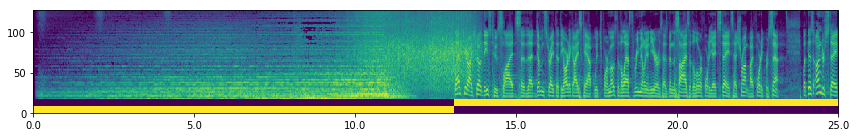

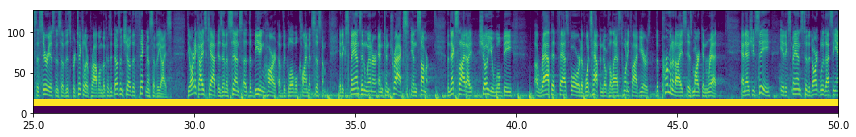

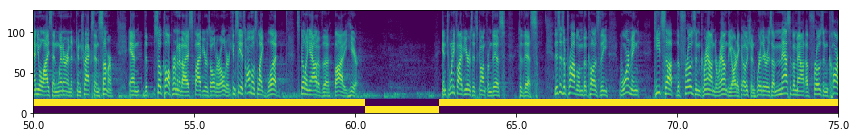

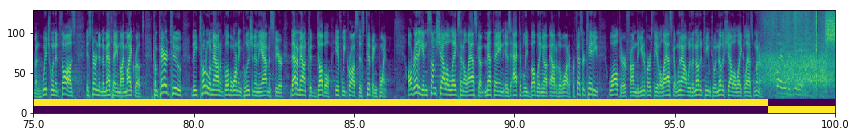

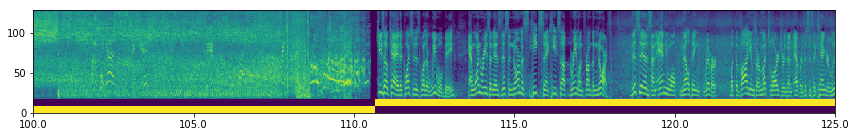

...

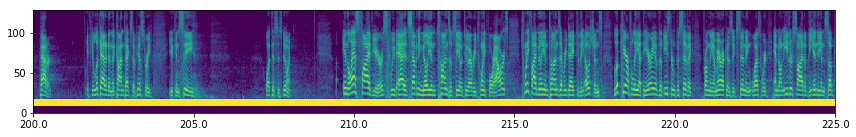

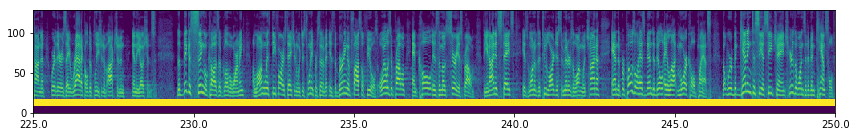

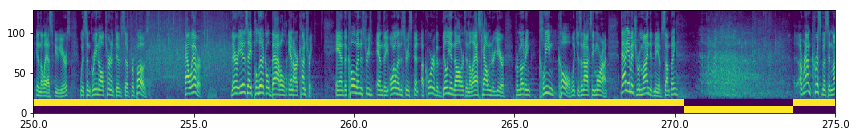

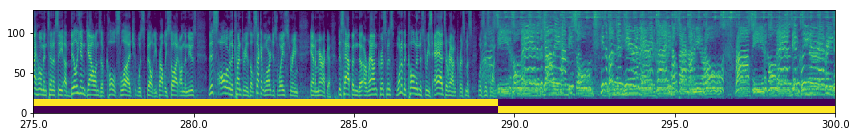

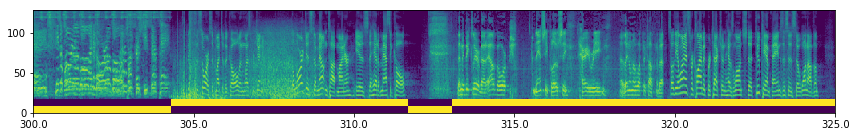

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


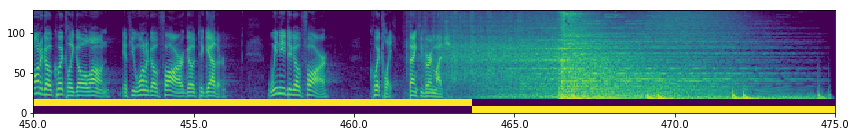

In [264]:
full_gram_db = librosa.power_to_db(full_gram, ref=np.max)
full_gram_db -= full_gram_db.min()

canvas = np.r_[np.tile(ignore, (10,1))*full_gram_db.max(),
               np.tile(full_labels, (10,1))*full_gram_db.max(), 
               full_gram_db]

for i in range(canvas.shape[1]//1000+1):
    st = i * 1000
    end = (i+1) * 1000 if (i+1) * 1000 < full_sig_len else full_sig_len
    plt.figure(figsize=(12,2))
    plt.imshow(canvas[:,st:end], origin="lower", extent=[st, end, 0, 128])
    xticks_seconds = np.array(range(st,(end+1))[::200])*hs/16000
    plt.gca().set_xticklabels(xticks_seconds.tolist())
    plt.tight_layout()
    plt.show()

29000 29967


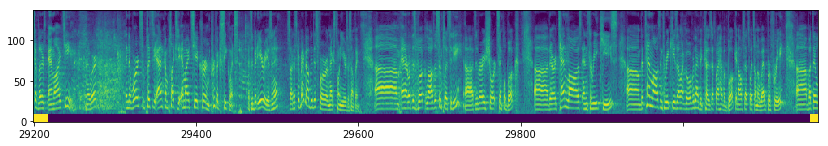